### Methods defined in the notebook. See next section for example

In [1]:
import os

import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from PIL import Image
import tensorflow as tf


2021-10-21 13:26:58.508995: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2021-10-21 13:26:58.509022: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


In [2]:
def predict_image(image, model):
    category_to_label = {
        0: "Negative",
        1: "Primordial", 
        2: "Primary", 
        3: "Secondary", 
        4: "Tertiary", 
    }

    image = image.resize((224,224))
    image = np.array(image)
    image = tf.reshape(image, (1,224,224,3))
    pred = model.predict(image)
    predicted_category, proba = np.argmax(pred),  np.max(pred)
    predicted_label = category_to_label[predicted_category]
    return predicted_label, proba


In [3]:
def display_slice_and_predictions(coupe, predicted_locations):
    linewidth=3
    label_to_color = {
        "Negative": "grey", 
        "Primordial": "blue", 
        "Primary": "red", 
        "Secondary": "green", 
        "Teriary": "darkgreen"
    }
    
    plt.figure(figsize=(20, 20))
    plt.axis("off")
    plt.imshow(coupe)
    ax = plt.gca()
    for prediction in predicted_locations:
        box = prediction["bbox"]
        label = prediction["label"]
        proba = prediction["proba"]

        color = label_to_color[label]
        text = "{}: {:.2f}".format(label, proba)
        linestyle = "-" if proba == 1 else "--"

        x1, y1, x2, y2 = box
        w, h = x2 - x1, y2 - y1
        patch = plt.Rectangle(
            [x1, y1], w, h, fill=False, edgecolor=color, linewidth=linewidth, linestyle=linestyle
        )
        ax.add_patch(patch)

        ax.text(
            x1,
            y1,
            text,
            bbox={"facecolor": color, "alpha": 1},
            clip_box=ax.clipbox,
            clip_on=True,
        )
    plt.show()

In [4]:
def generate_grid_for_image(image, box_width_pixels=800):
    """generator of square boxes that create a grid overlay for the given image"""
    width = box_width_pixels
    stride = width // 2

    x1 = 0
    y1 = 0
    while True:
        while True:
            bbox = (x1, y1, x1 + width, y1 + width)
            yield bbox

            x1 = x1 + stride
            if x1 + width > image.width:
                break
        x1 = 0
        y1 += stride

        if y1 + width > image.height:
            break



In [5]:

def predict_locations_for_gridsize(coupe, box_width_pixels, model):
    boxes = generate_grid_for_image(coupe, box_width_pixels=box_width_pixels)
    predicted_locations = []
    for box in boxes:
        cropped_image = coupe.crop(box)
        label, proba = predict_image(cropped_image, model)
        predicted_locations.append({
                "bbox": box,
                "label": label,
                "proba": proba
            })
    return predicted_locations

def filter_predictions(predicted_locations, proba_threshold=0.6):
    def should_keep_prediction(label, proba):
        if label == "Negative":
            return False
        if proba < proba_threshold:
            return False
        return True

    selected_locations = [
        prediction
        for prediction in predicted_locations
        if should_keep_prediction(prediction["label"], prediction["proba"])
    ]

    return selected_locations


In [6]:
def load_true_locations(path, image_filename):
    """Return list of {bbox, label, proba}."""
    df = pd.read_csv(path)
    df = df.loc[df["filename"] == image_filename] 
    locations = []
    for _, row in df.iterrows():
        loc_dict = {
            "bbox": (row['xmin'], row['ymin'], row['xmax'], row['ymax']),
            "label": row["class"],
            "proba": 1
        }
        locations.append(loc_dict)
    return locations

# Actual Example: locating follicules in full ovary image


## Goal

We want to locate and classify follicles in ovary images.

## Method

- We devide the full image is a grid of smaller images
    - this is done twice with two scale factors: "vignettes" of size 1000px and 200px
    - the vignettes overlap when forming a grid
- A prediction is performed for each vignette
    - the image is rescaled to 124px to fit the required model input
    - model output is a list of probabilities [p1, p2, p3, p4, p5] corresponding to the five
      classes available during training: ["Negative", "Primordial", "Primary", "Secondary", "Tertiary"]
    - the top probability gives us the predicted class
- We filter predicted classes
    - we exclude the class "Negative" before displaying results
    - we exclude predictions with low probability (p < 0.6)
- We display the bounding boxes of the predicted vignettes
- No metric is implemented as of now to measure the performance of this approach


## Loading data

- source image as jpg
- pre-trained model.
    The model was trained on small images cropped from the full ovary images
- true location of follicles in image



In [8]:
this_folder = os.path.abspath("")
DATA_FOLDER = os.path.join(this_folder, "data")
MODELS_FOLDER = os.path.join(this_folder, "models")

IMAGE_TO_ANALYSE = 'D-1M01-3.jpg'
MODEL_NAME_FOR_PREDICTION = "classifier"


coupe = Image.open(os.path.join(DATA_FOLDER, "coupes_jpg", IMAGE_TO_ANALYSE))
model_loaded = tf.keras.models.load_model(os.path.join(MODELS_FOLDER, MODEL_NAME_FOR_PREDICTION))
true_locations = load_true_locations(os.path.join(DATA_FOLDER, "scenario1", 'labels.csv'), IMAGE_TO_ANALYSE)

2021-10-21 13:28:56.117475: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory
2021-10-21 13:28:56.117498: W tensorflow/stream_executor/cuda/cuda_driver.cc:269] failed call to cuInit: UNKNOWN ERROR (303)
2021-10-21 13:28:56.117513: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (frcaud-Latitude-7420): /proc/driver/nvidia/version does not exist
2021-10-21 13:28:56.117683: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


## True locations of follicles in image

True locations are displayed with a solid outline. Box color correspond to the true class of the follicle.

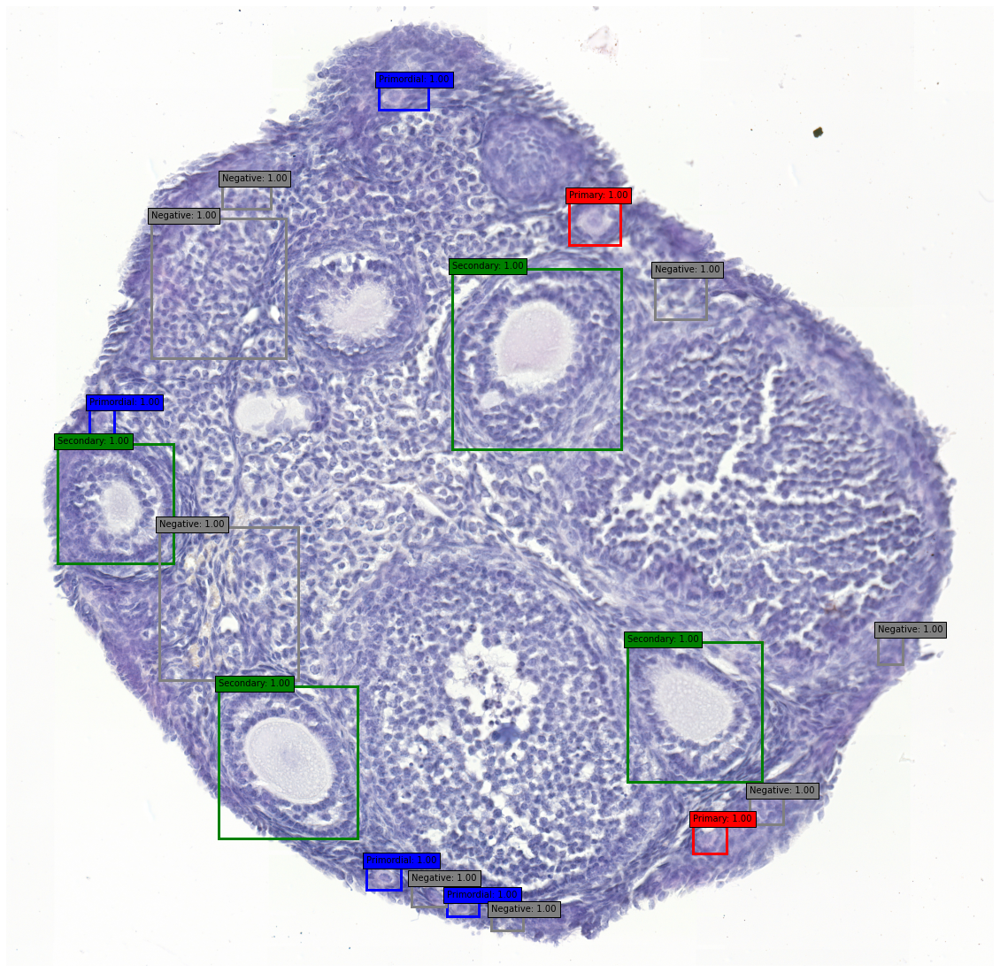

In [9]:

display_slice_and_predictions(coupe, true_locations)

## Predicting follicle locations on a large grid

We use a grid of 1000px. We observe that the model only predicts follicle of the category `"Secondary"` at this scale factor.

2021-10-21 13:29:52.930648: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


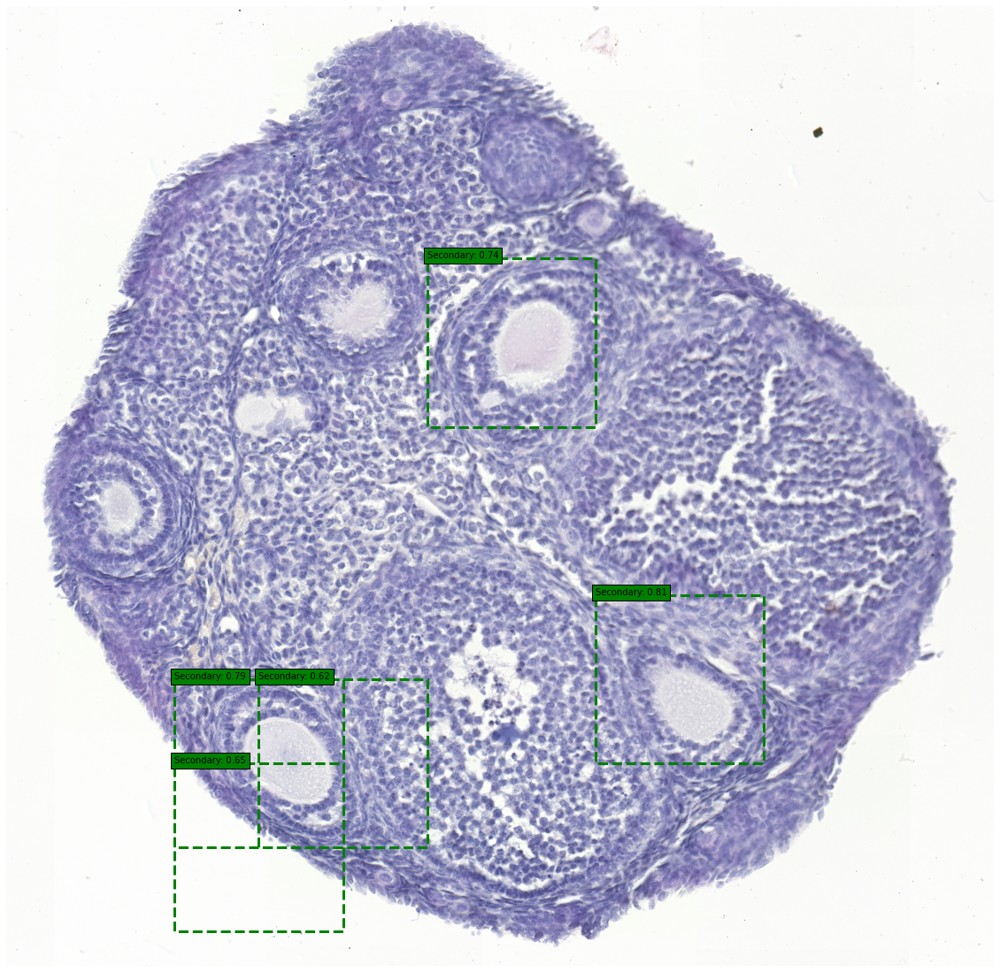

In [10]:
predicted_locations = predict_locations_for_gridsize(coupe, 1000, model_loaded)
selected_locations_large_grid = filter_predictions(predicted_locations)
display_slice_and_predictions(coupe, selected_locations_large_grid)

## Predicting follicle locations on a large grid

We use a grid of 200px. We observe that the model only predicts follicle of the categories `"Primary"` and `"Primordial"` at this scale factor.

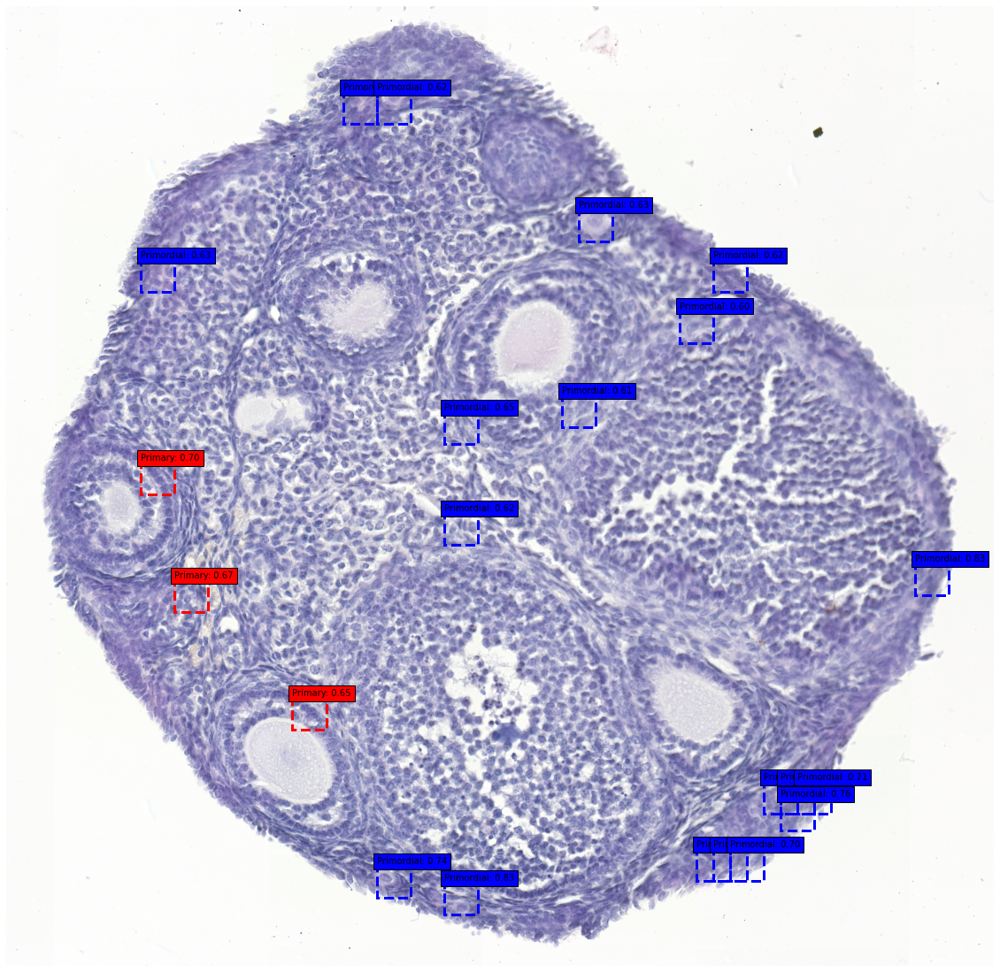

In [10]:
predicted_locations = predict_locations_for_gridsize(coupe, 200, model_loaded)
selected_locations_small_grid = filter_predictions(predicted_locations)
display_slice_and_predictions(coupe, selected_locations_small_grid)

Note that imposing a probablity threshold is required. Without this threshold the model predicts a large number of follicles in the provided grid.

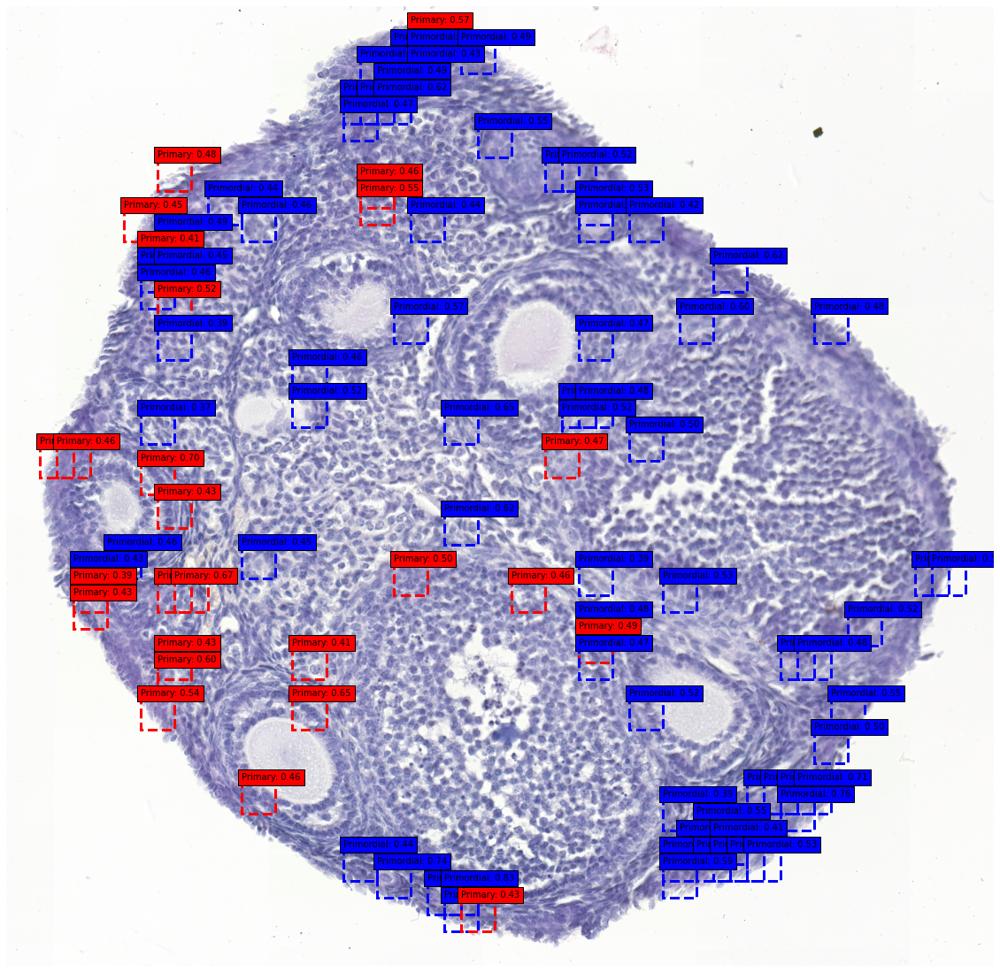

In [12]:
selected_locations_temp = filter_predictions(predicted_locations, proba_threshold=0.0)
display_slice_and_predictions(coupe, selected_locations_temp)

## Predictions + Ground Truth

- dashed = predictions
- solid = true locations

We observe:
- Secondary follicle are easy to locate
- the model is clueless for the other categories : Primary and Primordial

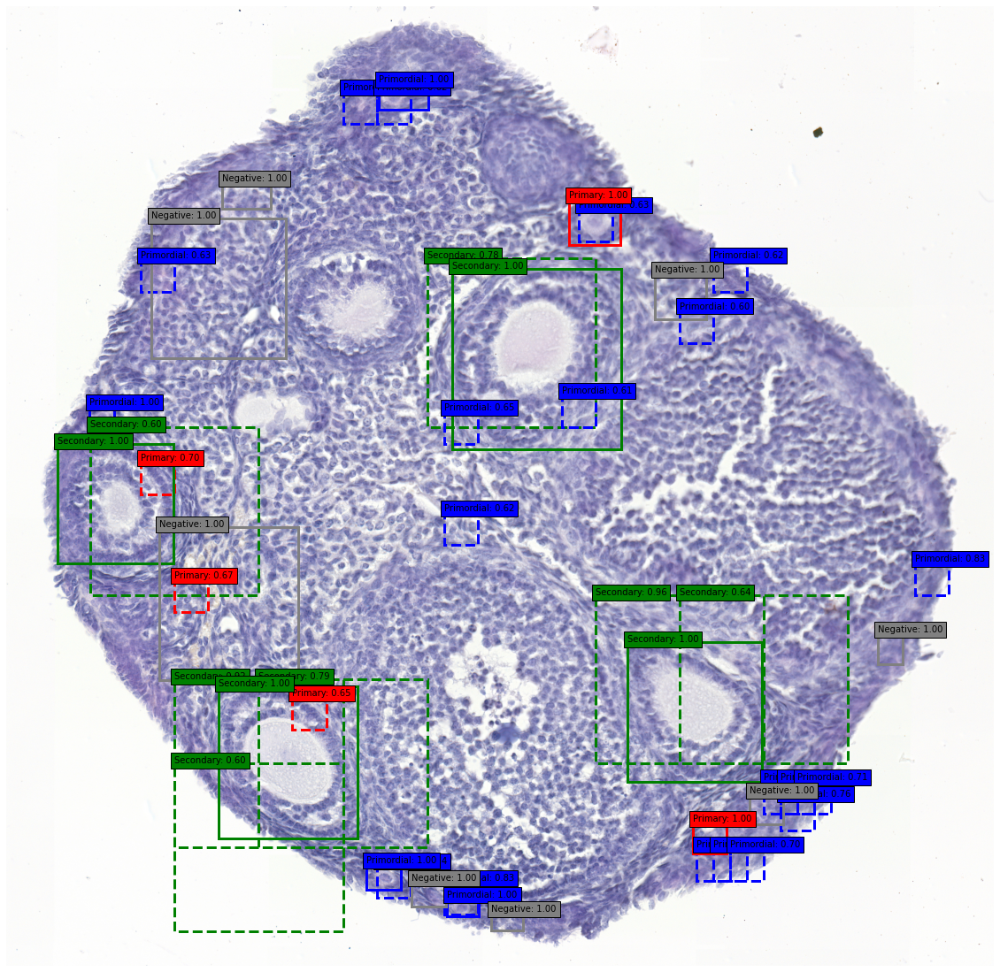

In [13]:
all_locations = selected_locations_large_grid + selected_locations_small_grid + true_locations
display_slice_and_predictions(coupe, all_locations)

# Conclusions

At the moment, this simple approach seems to be viable only for large structures (Secondary follicles).

This method can be improved by:

#### better prediction methodology
- running predictions on more scale factors
- applying bounding-box overlap post-processing (IOU)
- using the size of the image as a feature

#### better training

At the moment the model is trained on images that differ a lot from the images used in predictions
- true bounding boxes are not square but are reshaped to square when provided to the model during training
- the class "Negative" is built from bouding boxes created by Rafael. During prediction many locations are
  seen by the model that are not in this "Negative" dataset.

  Furthermore the class imbalance is probably very different between training and prediction.

  A possible solution would be to generate a training dataset in the same way predictions are performed: create a grid
  of vignette and decide on a class for each of these vignettes. 

## Model evaluation

Although we have a robust evaluation methodology for the classification problem (see classification notebook), we did
not define a metric that could be used to evaluate the model on the Follicles Detection task.



In [105]:
def compute_iou(boxes1, boxes2):
    """Computes pairwise IOU matrix for given two sets of boxes

    Arguments:
      boxes1: A tensor with shape `(N, 4)` representing bounding boxes
        where each box is of the format `[x, y, x2, y2]`.
        boxes2: A tensor with shape `(M, 4)` representing bounding boxes
        where each box is of the format `[x, y, xmax, ymax]`.

    Returns:
      pairwise IOU matrix with shape `(N, M)`, where the value at ith row
        jth column holds the IOU between ith box and jth box from
        boxes1 and boxes2 respectively.
    """
    lu = np.maximum(boxes1[:, None, :2], boxes2[:, :2])
    rd = np.minimum(boxes1[:, None, 2:], boxes2[:, 2:])
    intersection = np.maximum(0.0, rd - lu)
    intersection_area = intersection[:, :, 0] * intersection[:, :, 1]
    boxes1_area = (boxes1[:,2] - boxes1[:, 0]) * (boxes1[:,3] - boxes1[:, 1])
    boxes2_area = (boxes2[:,2] - boxes2[:, 0]) * (boxes2[:,3] - boxes2[:, 1])
    union_area = np.maximum(
        boxes1_area[:, None] + boxes2_area - intersection_area, 1e-8
    )
    return np.clip(intersection_area / union_area, 0.0, 1.0)

In [171]:
# image_name = "xxx"
IOU_THRESHOLD = 0.2


def build_multigrid_for_image(coupe):
    grid = np.concatenate([
        np.array(list(generate_grid_for_image(coupe, box_width_pixels=1000))),
        np.array(list(generate_grid_for_image(coupe, box_width_pixels=200)))
    ])
    return grid

def build_Y_true_for_grid(grid, true_locations):
    classes = [
        "Primordial", 
        "Primary",
        "Secondary",
        "Tertiary",
    ]
    Y_true = np.zeros((len(grid),len(classes)))

    for j, class_to_predict in enumerate(classes):
        true_bounding_boxes = np.array([
            location['bbox']
            for location in true_locations
            if location['label']==class_to_predict
        ])

        if len(true_bounding_boxes) == 0:
            continue

        n_y_true = len(true_bounding_boxes) 
        iou_matrix = compute_iou(true_bounding_boxes, grid)    

        for i in range(n_y_true):
            ious_for_this_box = iou_matrix[i, :]
            # array of length N corresponding to all windows
            best_index, max_value = ious_for_this_box.argmax(), ious_for_this_box.max()

            n_same_maximum = (ious_for_this_box == max_value).sum()
            if max_value < IOU_THRESHOLD:
                raise ValueError(f"Could not find a window for this bounding bow (max IOU = {max_value})")
            if n_same_maximum > 1:
                raise ValueError(f"Could not decide on multiple window candidates ({n_same_maximum})")
            if Y_true[best_index, j] == 1:
                raise ValueError("This window was allready assigned to another true bounding box")
            

            Y_true[best_index, j] = 1
    return Y_true


In [172]:
# Y PRED
def predict_image_all_proba(image, model):
    image = image.resize((224,224))
    image = np.array(image)
    image = tf.reshape(image, (1,224,224,3))
    pred = model.predict(image)
    return pred

def build_Y_pred_for_grid(coupe, grid, model):
    """
    
    Returns: np.array of dim (N = len(grid) , M=n_model_classes)
    """
    Y_pred = np.zeros((len(grid), 5))
    for i in range(grid.shape[0]):
        cropped_image = coupe.crop(tuple(grid[i, :]))
        probas = predict_image_all_proba(cropped_image, model)
        Y_pred[i, :] = np.array(probas)
    return Y_pred[:, 1:]  # ignore Negative class



In [188]:
from sklearn.metrics import precision_recall_curve, average_precision_score
from sklearn.metrics import PrecisionRecallDisplay, RocCurveDisplay
from sklearn.metrics import roc_curve, auc as compute_auc


def compute_metrics(Y_true, Y_pred):
    classes = [
        "Primordial", 
        "Primary",
        "Secondary",
        #"Tertiary",
    ]

    precision = {}
    recall = {}
    average_precision = {}
    tpr = {} 
    fpr = {}
    auc = {}

    for i, class_to_predict in enumerate(classes):
        precision[class_to_predict], recall[class_to_predict], threshold = precision_recall_curve(Y_true[:, i], Y_pred[:, i])
        average_precision[class_to_predict] = average_precision_score(Y_true[:, i], Y_pred[:, i])
        
        fpr[class_to_predict], tpr[class_to_predict], _ = roc_curve(Y_true[:, i], Y_pred[:, i])
        auc[class_to_predict] = compute_auc(fpr[class_to_predict], tpr[class_to_predict])

    return precision, recall, average_precision, tpr, fpr, auc


def display_metrics(Y_true, Y_pred):
    classes = [
        "Primordial", 
        "Primary",
        "Secondary",
        #"Tertiary",
    ]
    colors = ["navy", "turquoise", "darkorange", "cornflowerblue", "teal"]


    precision, recall, average_precision, tpr, fpr, auc = compute_metrics(Y_true, Y_pred)

    _, ax = plt.subplots(figsize=(7, 8))
    for class_to_predict, color in zip(classes, colors):
        display = PrecisionRecallDisplay(
            recall=recall[class_to_predict],
            precision=precision[class_to_predict],
            average_precision=average_precision[class_to_predict],
        )
        display.plot(ax=ax, name=f"Precision-recall for class {class_to_predict}", color=color)
    plt.show(ax)

    _, ax = plt.subplots(figsize=(7, 8))
    for class_to_predict, color in zip(classes, colors):
        display = RocCurveDisplay(
            fpr=fpr[class_to_predict],
            tpr=tpr[class_to_predict],
            roc_auc=auc[class_to_predict], estimator_name=class_to_predict)
        display.plot(ax=ax, color=color)

    plt.show(ax)

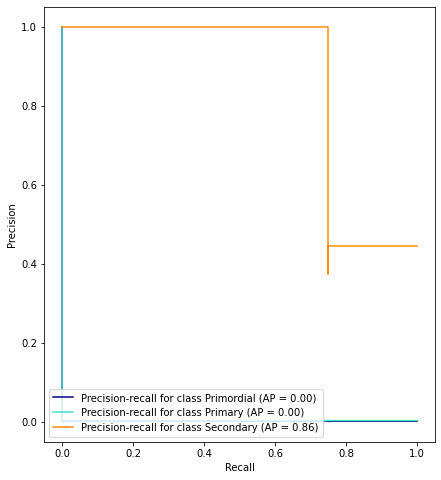

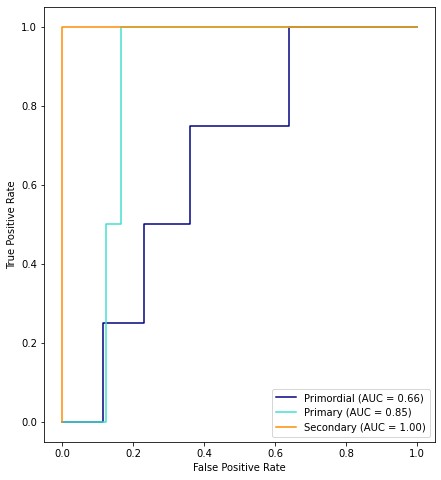

In [189]:
grid = build_multigrid_for_image(coupe)
Y_true = build_Y_true_for_grid(grid, true_locations)
Y_pred = build_Y_pred_for_grid(coupe, grid, model_loaded)

display_metrics(Y_true, Y_pred)

In [182]:
coupes = ["D-1M01-2.jpg", "D-1M01-3.jpg"]#, "D-1M01-4.jpg", "D-1M01-5.jpg"]

Y_true = []
Y_pred = []

for IMAGE_TO_ANALYSE in coupes:
    coupe = Image.open(os.path.join(DATA_FOLDER, "coupes_jpg", IMAGE_TO_ANALYSE))
    true_locations = load_true_locations(os.path.join(DATA_FOLDER, "scenario1", 'labels.csv'), IMAGE_TO_ANALYSE)
    grid = build_multigrid_for_image(coupe)
    Y_true.append(build_Y_true_for_grid(grid, true_locations))
    Y_pred.append(build_Y_pred_for_grid(coupe, grid, model_loaded))

Y_true = np.concatenate(Y_true, axis=0)
Y_true.shape

(5063, 4)

In [184]:
Y_pred = np.concatenate(Y_pred, axis=0)
Y_pred.shape

(5063, 4)

/home/frcaud/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/metrics/_ranking.py:817: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]
/home/frcaud/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/metrics/_ranking.py:949: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn("No positive samples in y_true, "
/home/frcaud/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/metrics/_ranking.py:817: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]


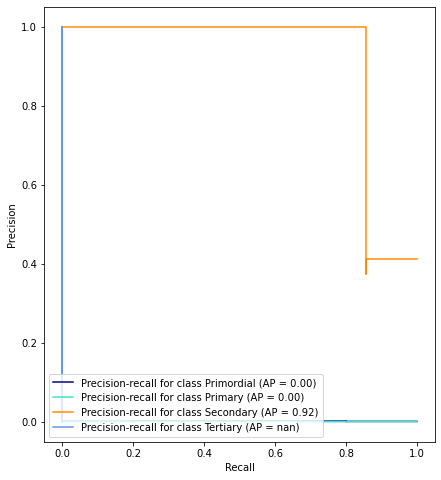

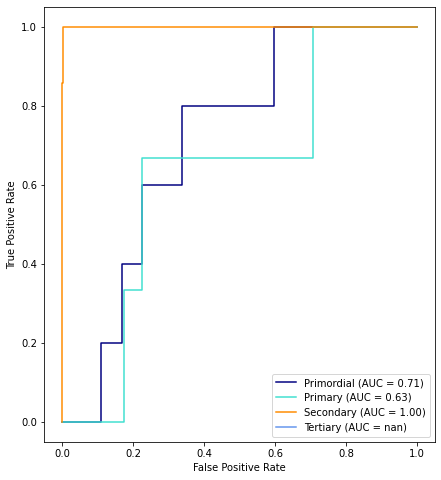

In [185]:
display_metrics(Y_true, Y_pred)